In [44]:
import os

In [45]:
%matplotlib inline

In [46]:
import numpy as np

In [47]:
from matplotlib import pyplot as plt

In [48]:
from photutils.aperture import EllipticalAperture

In [49]:
seed = os.getenv("GUIDE_RANDOM_SEED", None)

if seed is not None:
    seed = int(seed)

noise_rng = np.random.default_rng(seed)

In [50]:
from convenience_functions import show_image

In [51]:
synthetic_image = np.zeros([1000, 1000])

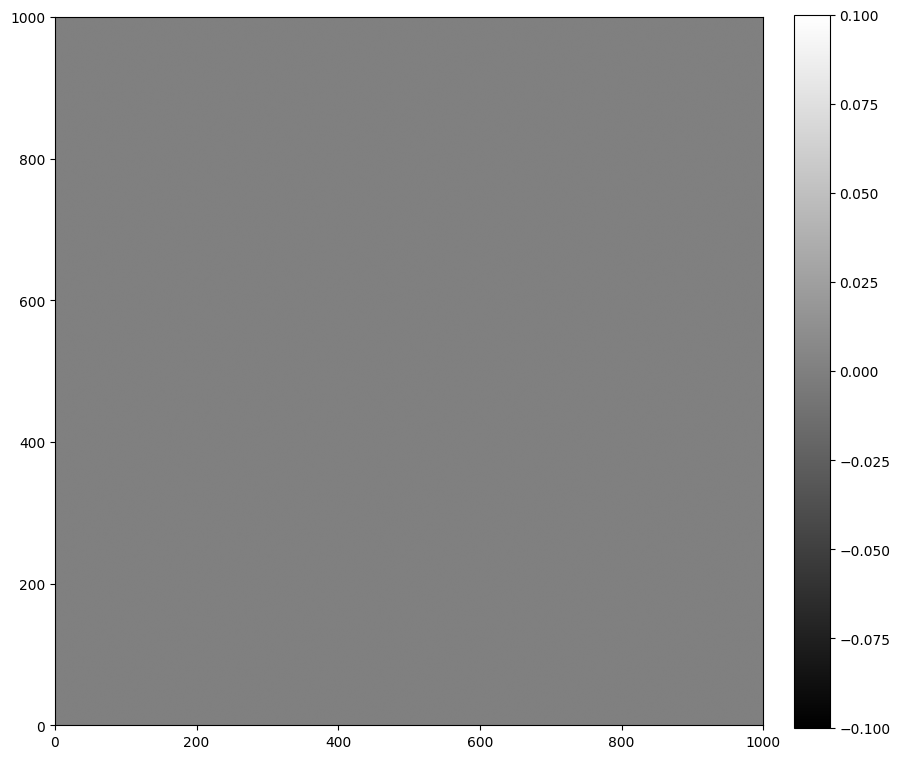

In [52]:
show_image(synthetic_image, cmap='gray')

In [53]:
def read_noise(image, amount, gain=1):
    shape = image.shape
    noise = noise_rng.normal(scale=amount/gain, size=shape)
    return noise

<Figure size 640x480 with 0 Axes>

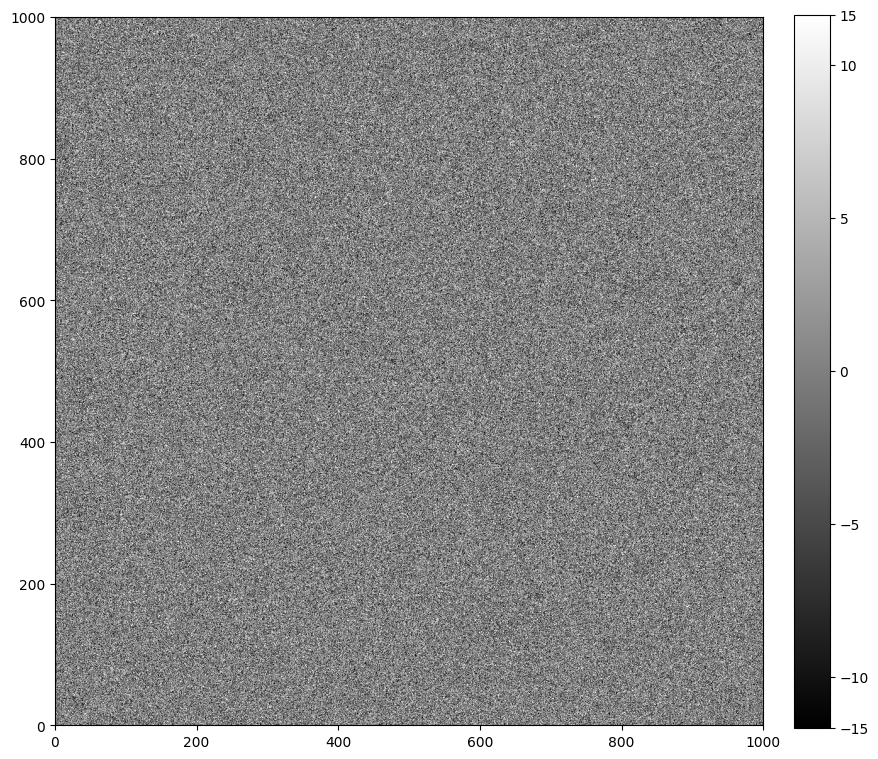

In [54]:
plt.figure()
noise_im = synthetic_image + read_noise(synthetic_image, 5)
show_image(noise_im, cmap='gray')

In [55]:
def bias(image, value, realistic=False):
    bias_im = np.zeros_like(image) + value
    if realistic:
        shape = image.shape
        number_of_columns = 5
        
        rng = np.random.RandomState(seed=7990)
        columns = rng.randint(0, shape[1], size=number_of_columns)
        
        col_pattern = rng.randint(0, int(0.1 * value), size=shape[0])
    
    for c in columns:
        bias_im[:, c] = value + col_pattern
    return bias_im
    

Text(0.5, 1.0, 'Realistic bias frame (includes read noise)')

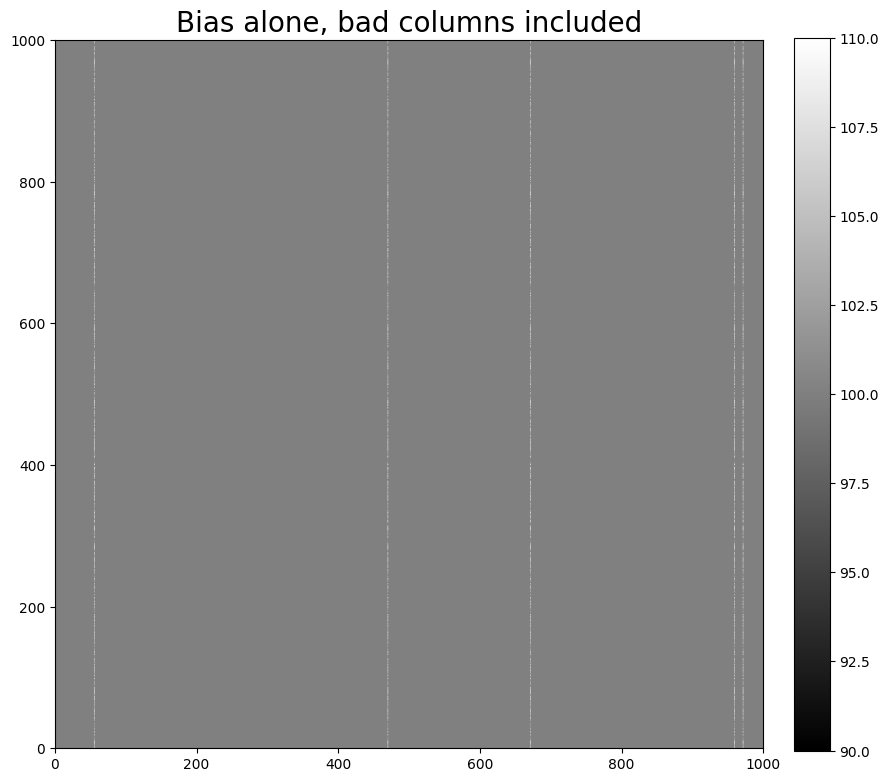

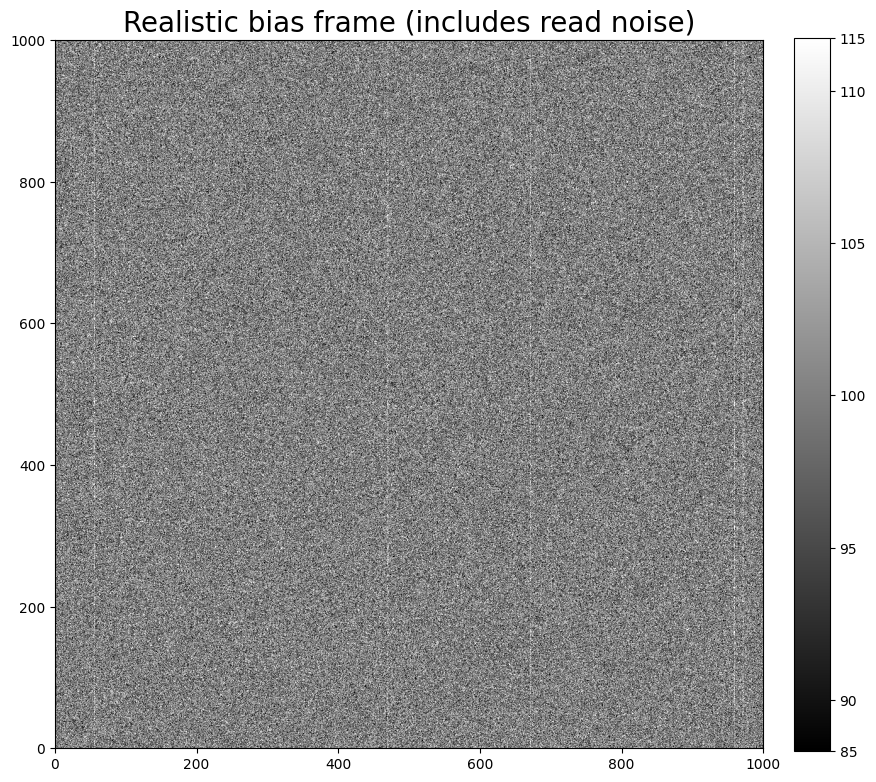

In [56]:
bias_only = bias(synthetic_image, 100, realistic=True)
show_image(bias_only, cmap='gray', figsize=(10,10))
plt.title('Bias alone, bad columns included', fontsize='20')

bias_noise_im = noise_im + bias_only
show_image(bias_noise_im, cmap='gray', figsize=(10,10))
plt.title('Realistic bias frame (includes read noise)', fontsize='20')

In [57]:
def dark_current(image, current, exposure_time, gain=1.0, hot_pixels=False):
    base_current = current * exposure_time / gain
    dark_im = noise_rng.poisson(base_current, size=image.shape)
    
    if hot_pixels:
        
        y_max, x_max = dark_im.shape
        n_hot = int(0.0001 * x_max * y_max)
        rng = np.random.RandomState(8748902)
        hot_x =rng.randint(0, x_max, size=n_hot)
        hot_y =rng.randint(0, y_max, size=n_hot)
        hot_current = 10000 * current
        dark_im[(hot_y,hot_x)] = hot_current * exposure_time / gain
    return dark_im

Text(0.5, 1.0, 'dark current only')

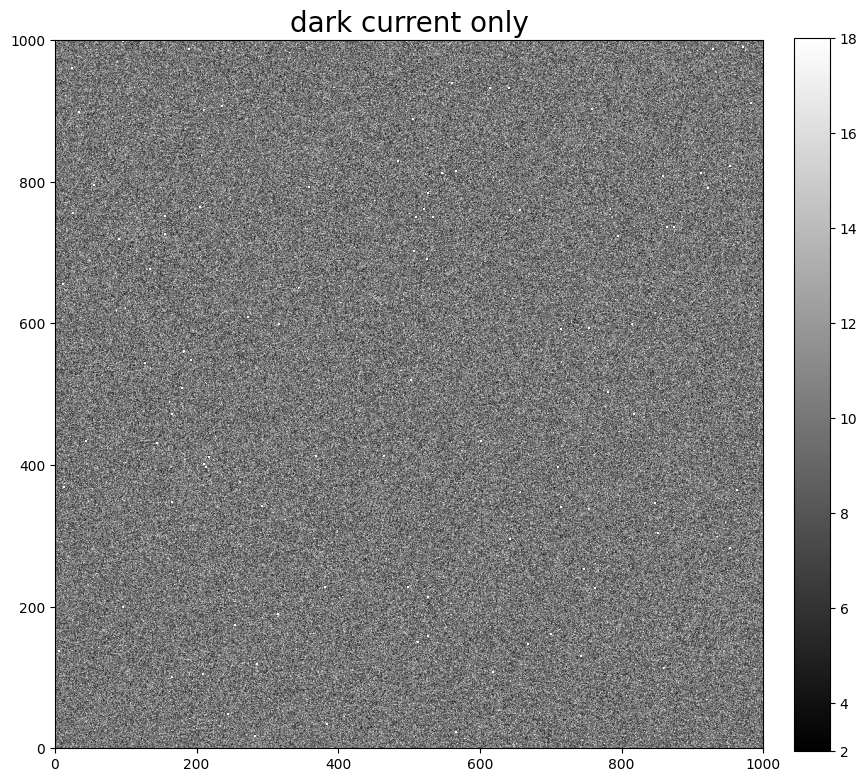

In [58]:
dark_exposure = 100
dark_cur = 0.1
dark_only = dark_current(synthetic_image, dark_cur, dark_exposure, hot_pixels=True)
show_image(dark_only, cmap='gray')
plt.title("dark current only", fontsize='20')

Text(0.5, 1.0, 'Realistic dark frame with bias and read noise')

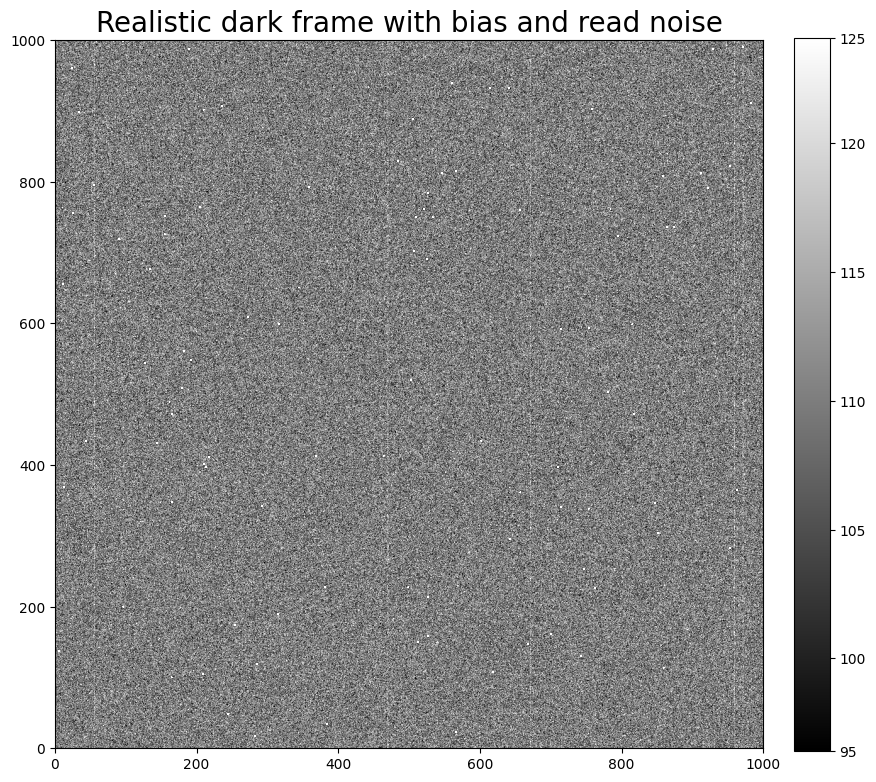

In [59]:
dark_bias_noise_im = bias_noise_im +dark_only
show_image(dark_bias_noise_im, cmap='gray')
plt.title("Realistic dark frame with bias and read noise", fontsize='20')

In [60]:
def sky_background(image, sky_counts, gain=1):
    sky_im = noise_rng.poisson(sky_counts * gain, size=image.shape) / gain
    return sky_im

Text(0.5, 1.0, 'Sky background only, 100 counts')

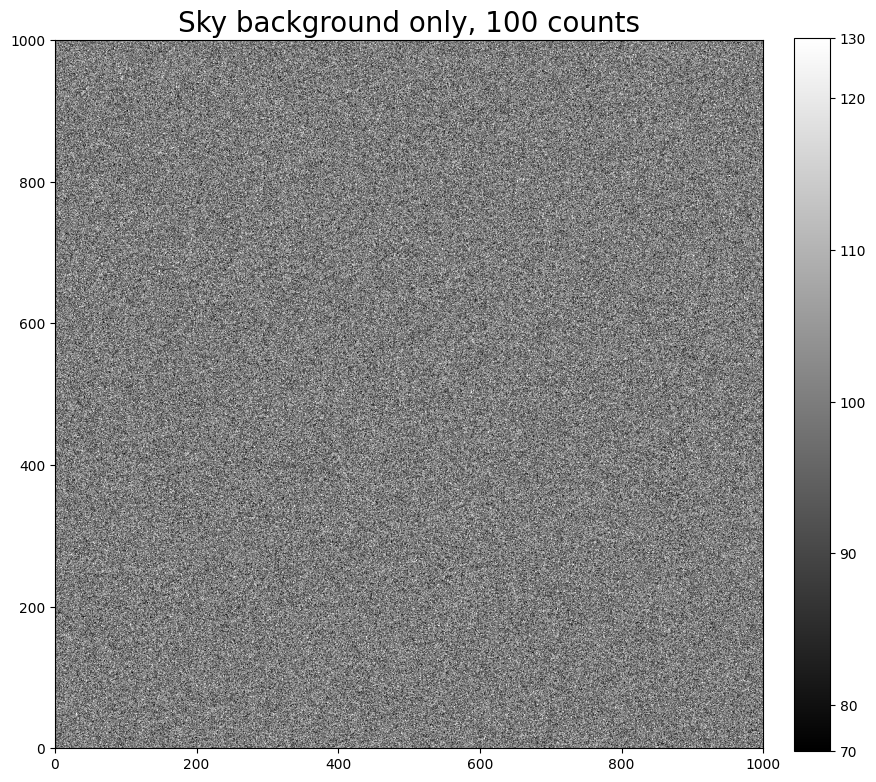

In [61]:
sky_level = 100
sky_only = sky_background(synthetic_image, sky_level)
show_image(sky_only, cmap='gray')
plt.title('Sky background only, 100 counts', fontsize='20')

Text(0.5, 1.0, 'Sky, dark, bias, noise frame')

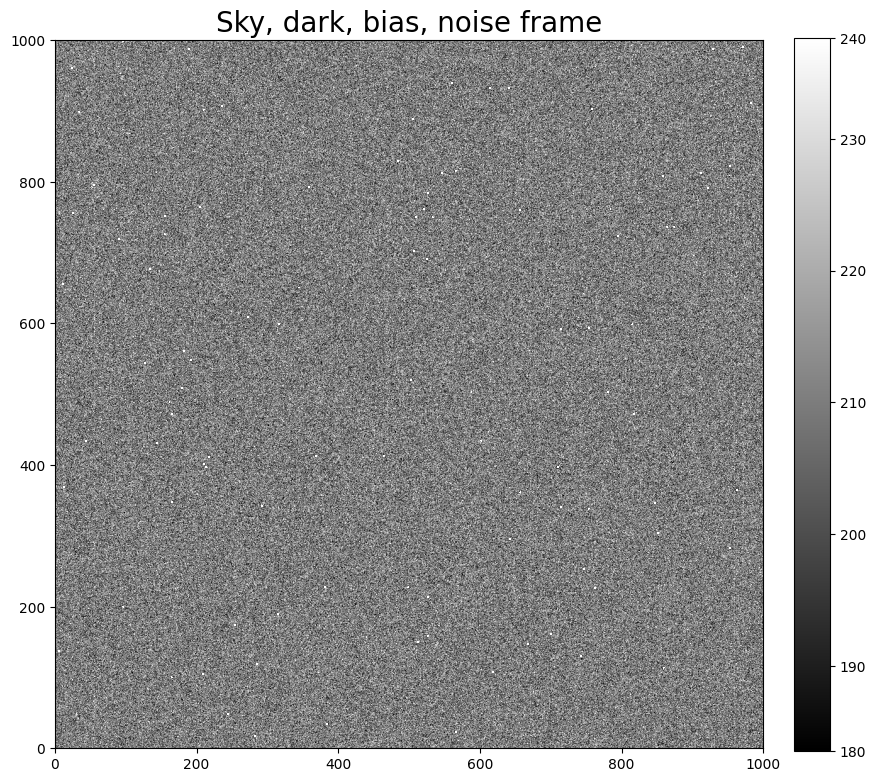

In [62]:
sky_dark_bias_noise_im = dark_bias_noise_im +sky_only
show_image(sky_dark_bias_noise_im, cmap='gray')
plt.title("Sky, dark, bias, noise frame", fontsize='20')

Text(0.5, 1.0, 'Sky, bias, noise frame')

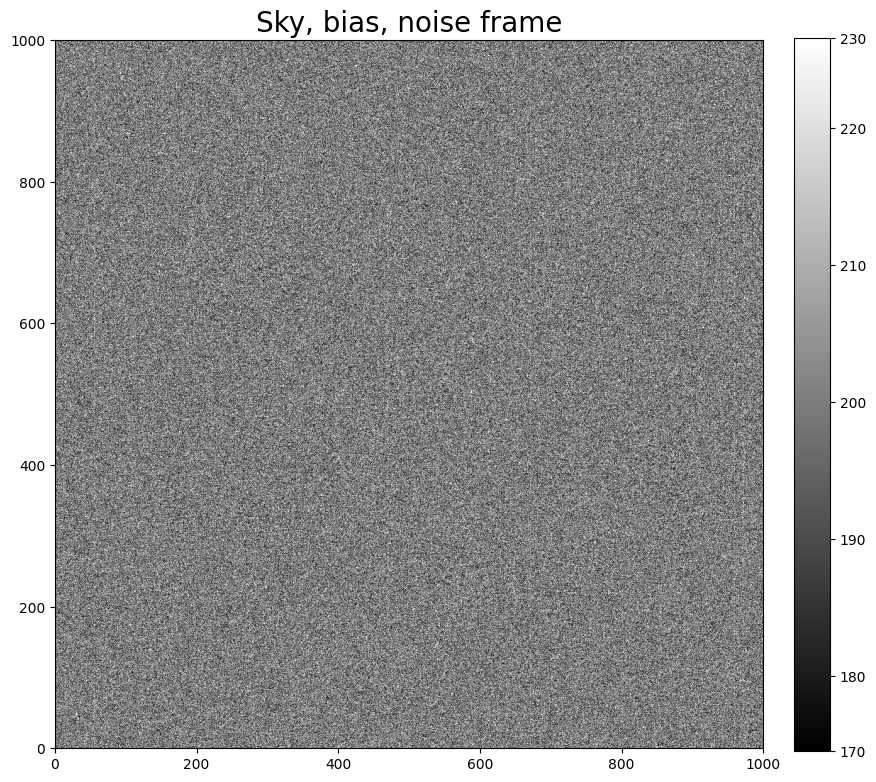

In [63]:
sky_bias_noise_im = bias_noise_im + sky_only
show_image(sky_bias_noise_im, cmap='gray')
plt.title("Sky, bias, noise frame", fontsize='20')

In [64]:
from ipywidgets import interactive, interact

In [65]:
from photutils.datasets import make_random_gaussians_table, make_gaussian_sources_image

In [70]:
def stars(image, number, max_counts=10000, gain=1):
    

    flux_range = [max_counts/10, max_counts]
    y_max, x_max = image.shape
    xmean_range = [0.1 * x_max, 0.9 * y_max]
    ymean_range = [0.1 * x_max, 0.9 * y_max]
    xstddev_range = [4,4]
    ystddev_range = [4,4]
    params = dict([('amplitude', flux_range),('x_mean', xmean_range), ('y_mean', ymean_range), ('x_sd', xstddev_range), ('y_sd', ystddev_range), ('theta', [0, 2 * np.pi])])
    sources = make_random_gaussians_table(number, params, seed=12345)
    star_im = make_gaussian_sources_image(image.shape, sources)
    return star_im

Text(0.5, 1.0, 'Three Stars Only')

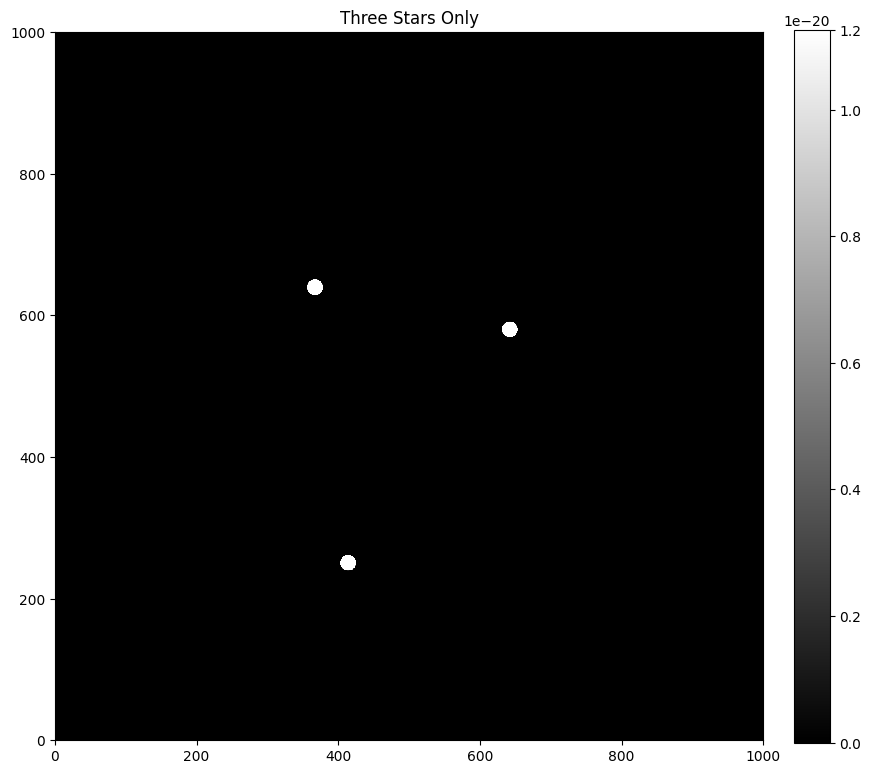

In [71]:
star_only = stars(synthetic_image, 3, max_counts = 2000)
show_image(star_only, cmap='gray', percu=99.9)
plt.title("Three Stars Only")

Text(0.5, 1.0, 'Three stars with sky counts = 100, bias counts = 100, read noise = 5, dark current = 0.1')

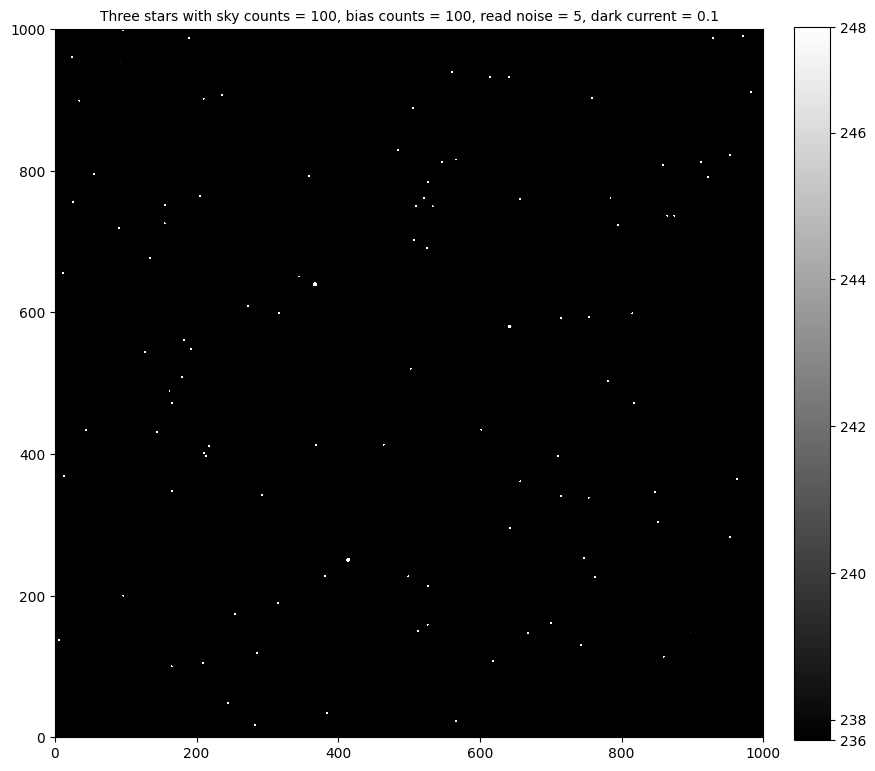

In [72]:
stars_with_noise_bias_sky_dark_im = sky_dark_bias_noise_im + star_only
show_image(stars_with_noise_bias_sky_dark_im, cmap='gray', percu=99.9)
plt.title("Three stars with sky counts = 100, bias counts = 100, read noise = 5, dark current = 0.1", fontsize="10")

Text(0.5, 1.0, 'Three Stars with sky count = 100, bias level = 100, read noise = 5 and no dark current')

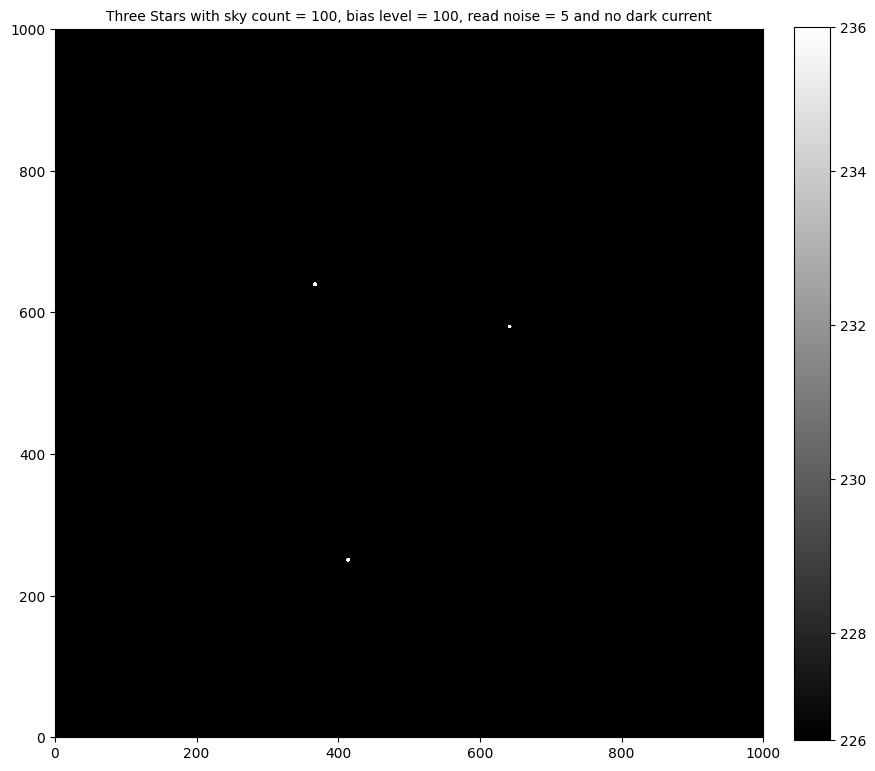

In [73]:
stars_with_noise_bias_sky_nodark_im = sky_bias_noise_im +star_only
show_image(stars_with_noise_bias_sky_nodark_im, cmap='gray', percu = 99.9)
plt.title("Three Stars with sky count = 100, bias level = 100, read noise = 5 and no dark current", fontsize='10')